# Data Augmentation

In [18]:
from os.path import join
from os import environ

## Preparación de ambiente

### Carga de módulos

In [1]:
# Data wrangling
import os
import random
import numpy as np
from glob import glob
from shutil import copy, rmtree

# Image manipulation
import cv2 # pip install opencv-python
from PIL import Image

# Data Visualization
import pandas as pd
import cufflinks as cf

# Preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Modeling
import tensorflow as tf
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization

# Model performance
from keras.metrics import RootMeanSquaredError, MeanAbsoluteError, MeanAbsolutePercentageError

# Environment setup
cf.set_config_file(offline=True, theme="solar")

2025-01-07 22:28:16.807815: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-07 22:28:17.775051: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Funciones relevantes (data augmentation)

In [2]:
def flip_image(image_path, destiny_path):
    original = cv2.imread(image_path)
    flipped = cv2.flip(original, 1)
    cv2.imwrite(destiny_path, flipped)

In [3]:
flip_image('./wheres_waldo/images/8.jpg', "./flipped.jpg")

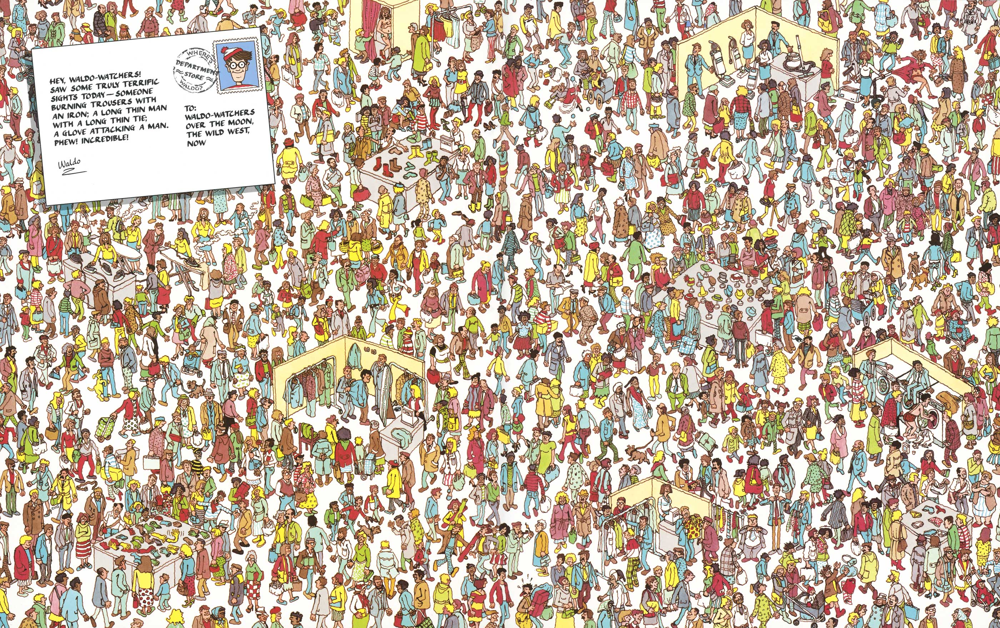

In [4]:
Image.open("./wheres_waldo/images/8.jpg")

In [ ]:
Image.open("./flipped.jpg")

In [6]:
def rotation(image_path, destiny_path, angle):
    img = cv2.imread(image_path)
    angle = int(random.uniform(-angle, angle))
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((int(w/2), int(h/2)), angle, 1)
    img = cv2.warpAffine(img, M, (w, h))
    cv2.imwrite(destiny_path, img)

In [7]:
rotation('./wheres_waldo/images/8.jpg', "./rotated.jpg", 10)

In [ ]:
Image.open("./rotated.jpg")

In [9]:
def channel_shift(image_path, destiny_path, value):
    img = cv2.imread(image_path)
    value = int(random.uniform(-value, value))
    img = img + value
    img[:,:,:][img[:,:,:]>255]  = 255
    img[:,:,:][img[:,:,:]<0]  = 0
    img = img.astype(np.uint8)
    cv2.imwrite(destiny_path, img)

In [10]:
def draw_annotation(image_path, x_min, y_min, x_max, y_max, color=(0, 255, 0), thickness=3):
    im = Image.open(image_path)
    im = cv2.rectangle(np.array(im), (x_min, y_min), (x_max, y_max), color, thickness)
    return Image.fromarray(im)

In [11]:
channel_shift('./wheres_waldo/images/8.jpg', "cs.jpg", 10)

In [ ]:
Image.open("cs.jpg")

## Data Wrangling

### Preparación de carpetas

#### Pre limpieza

In [13]:
if os.path.exists("./waldo_classif/"):
    rmtree("./waldo_classif/")

### Construcción de carpetas

In [14]:
base_path = "./waldo_classif/"
for set_ in ["train", "test"]:
    for class_ in ["waldo", "notwaldo"]:
        folder = os.path.join(base_path, set_, class_)
        if not os.path.exists(folder):
            os.makedirs(folder)

In [15]:
!git clone https://github.com/vc1492a/Hey-Waldo.git

fatal: destination path 'Hey-Waldo' already exists and is not an empty directory.


#### Listado de archivos

In [16]:
source = "./Hey-Waldo/256-gray/"
destiny = "./waldo_classif/"

In [17]:
ls_images = glob(os.path.join(source, "**/*.jpg"))

In [ ]:
ls_images

In [19]:
ls_notwaldo = [x for x in ls_images if "notwaldo" in x]
ls_waldo = [x for x in ls_images if x not in ls_notwaldo]

In [20]:
len(ls_waldo)

31

In [21]:
len(ls_notwaldo)

286

In [22]:
len(ls_waldo) / (len(ls_waldo)+len(ls_notwaldo))

0.09779179810725552

#### Preparación de sets + Data Augmentation

In [23]:
for image in ls_waldo:
    if np.random.rand() <= 0.7:
        new_train = os.path.join(destiny, "train", "waldo", image.split("/")[-1])
        copy(image, new_train)
        flip_image(image, new_train.replace(".jpg", "_f.jpg"))
        for i in range(1, 11):
            rotation(image, new_train.replace(".jpg", f"r{i}.jpg"), i)
            # channel_shift(image, new_train.replace(".jpg", f"s{i}.jpg"), i)
    else:
        new_test = os.path.join(destiny, "test", "waldo", image.split("/")[-1])
        copy(image, new_test)

In [24]:
for image in ls_notwaldo:
    if np.random.rand() <= 0.7:
        new_train = os.path.join(destiny, "train", "notwaldo", image.split("/")[-1])
        copy(image, new_train)
    else:
        new_test = os.path.join(destiny, "test", "notwaldo", image.split("/")[-1])
        copy(image, new_test)

#### Generadores

In [25]:
ImageDataGenerator?

Init signature:
ImageDataGenerator(
    featurewise_center=False,
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    zca_epsilon=1e-06,
    rotation_range=0,
    width_shift_range=0.0,
    height_shift_range=0.0,
    brightness_range=None,
    shear_range=0.0,
    zoom_range=0.0,
    channel_shift_range=0.0,
    fill_mode='nearest',
    cval=0.0,
    horizontal_flip=False,
    vertical_flip=False,
    rescale=None,
    preprocessing_function=None,
    data_format=None,
    validation_split=0.0,
    interpolation_order=1,
    dtype=None,
)
Docstring:      DEPRECATED.
File:           ~/virtualenvs/unam/lib/python3.12/site-packages/keras/src/legacy/preprocessing/image.py
Type:           type
Subclasses:     

In [26]:
dgen_train = ImageDataGenerator(rescale=1./255,
                                validation_split=0.2,
                                zoom_range=0.2)

In [27]:
dgen_test = ImageDataGenerator(rescale=1./255)

In [28]:
train_path = os.path.join(destiny, "train")

In [29]:
test_path = os.path.join(destiny, "test")

In [30]:
TARGET_SIZE = (256, 256)
BATCH_SIZE = 256
CLASS_MODE = "categorical"

In [31]:
train_generator = dgen_train.flow_from_directory(train_path,
                                                 target_size=TARGET_SIZE,
                                                 subset='training',
                                                 batch_size=BATCH_SIZE,
                                                 class_mode=CLASS_MODE)

Found 373 images belonging to 2 classes.


In [32]:
val_generator = dgen_train.flow_from_directory(train_path,
                                                 target_size=TARGET_SIZE,
                                                 subset='validation',
                                                 batch_size=BATCH_SIZE,
                                                 class_mode=CLASS_MODE)

Found 92 images belonging to 2 classes.


In [33]:
test_generator = dgen_test.flow_from_directory(test_path,
                                               target_size=TARGET_SIZE,
                                               batch_size=BATCH_SIZE,
                                               class_mode=CLASS_MODE)

Found 83 images belonging to 2 classes.


In [34]:
train_generator.class_indices

{'notwaldo': 0, 'waldo': 1}

## Modelado

### Modelo base

In [35]:
model = Sequential()

### Bloque convolucional

In [36]:
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=train_generator.image_shape))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())

/home/oscar/virtualenvs/unam/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



### Capas densamente conectadas

In [37]:
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

In [38]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    58,982,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,077,186 (225.36 MB)

 Trainable params: 59,077,186 (225.36 MB)

 Non-trainable params: 0 (0.00 B)

### Configuración del modelo

#### Configuración

In [39]:
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

#### Callbacks

In [40]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=20)

In [41]:
checkpoint = tf.keras.callbacks.ModelCheckpoint('models/waldo_classif/model_{val_accuracy:.3f}_.keras',
                               save_best_only=True,
                               save_weights_only=False,
                               monitor='val_accuracy'
                                 )

### Entrenamiento

In [42]:
history = model.fit(train_generator,
                    epochs=20,
                    validation_data=test_generator,
                    callbacks=[early_stopping, checkpoint])

/home/oscar/virtualenvs/unam/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/20


2025-01-07 22:28:28.016484: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 966191616 exceeds 10% of free system memory.
2025-01-07 22:28:30.923438: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 966191616 exceeds 10% of free system memory.


1/2 ━━━━━━━━━━━━━━━━━━━━ 5s 6s/step - accuracy: 0.5470 - loss: 0.6967

2025-01-07 22:28:32.212960: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2114060288 exceeds 10% of free system memory.
2025-01-07 22:28:32.989968: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1024000000 exceeds 10% of free system memory.
2025-01-07 22:28:35.828158: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1024000000 exceeds 10% of free system memory.


2/2 ━━━━━━━━━━━━━━━━━━━━ 15s 10s/step - accuracy: 0.5058 - loss: 11.6449 - val_accuracy: 0.1205 - val_loss: 16.3841
Epoch 2/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 14s 10s/step - accuracy: 0.5377 - loss: 5.1264 - val_accuracy: 0.8795 - val_loss: 0.4216
Epoch 3/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 15s 9s/step - accuracy: 0.5009 - loss: 0.8263 - val_accuracy: 0.8795 - val_loss: 0.4398
Epoch 4/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 14s 9s/step - accuracy: 0.5812 - loss: 0.6671 - val_accuracy: 0.8434 - val_loss: 0.4835
Epoch 5/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 15s 10s/step - accuracy: 0.6379 - loss: 0.6358 - val_accuracy: 0.8313 - val_loss: 0.4170
Epoch 6/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 20s 9s/step - accuracy: 0.6269 - loss: 0.5949 - val_accuracy: 0.8795 - val_loss: 0.5974
Epoch 7/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 15s 5s/step - accuracy: 0.7279 - loss: 0.5627 - val_accuracy: 0.8313 - val_loss: 0.4104
Epoch 8/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 20s 4s/step - accuracy: 0.6402 - loss: 0.5588 - val_accuracy: 0.8795 - val_loss: 0.5677
Epoch 9/20
2/2

### Performance

In [43]:
results = pd.DataFrame(history.history)

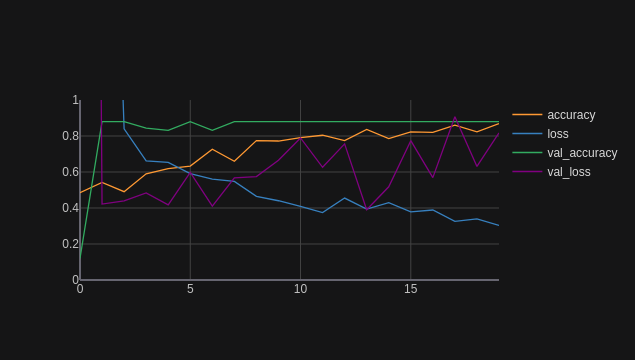

In [44]:
results.iplot(yrange=(0, 1))

In [45]:
test_loss, test_acc = model.evaluate(val_generator)
print('Test loss: {:,.2f}\nTest Accuracy: {:,.2f}'.format(test_loss, test_acc))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.8152 - loss: 0.5485
Test loss: 0.55
Test Accuracy: 0.82


### Predicción

In [46]:
test_path = "./wheres_waldo/images/18.jpg"

In [ ]:
test = Image.open(test_path)
test

In [ ]:
test = test.convert("1").convert('RGB')
test

In [49]:
M = 256
N = 256

In [ ]:
for n in range(1, 37):
    test_path = f"./wheres_waldo/images/{n}.jpg"
    test = Image.open(test_path)
    test = test.convert("1").convert('RGB')
    test = np.array(test)
    ls_x = []
    ls_y = []
    for x in range(0, test.shape[0], M):
        for y in range(0, test.shape[1], N):
            tile = test[x:x+M, y:y+N]
            img = Image.fromarray(tile)
            img = img.resize(TARGET_SIZE)
            img = np.expand_dims(img, 0)
            pred = model.predict(img, verbose=False)
            if pred[0][1] == 1:
                ls_x += [x, x+M]
                ls_y += [y, y+M]
    if ls_x and ls_y:
        display(draw_annotation(test_path, min(ls_y), min(ls_x), max(ls_y), max(ls_x), color=(0, 255, 0), thickness=10))